In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import confusion_matrix

import os
for dirname, _, filenames in os.walk('/WineQuality/winequality'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/WineQuality/winequality\winequality-names.txt
/WineQuality/winequality\winequality-names.txt.bak
/WineQuality/winequality\winequality-red.csv
/WineQuality/winequality\winequality-white.csv


In [2]:
#Load file
data_wine_red = pd.read_csv("/WineQuality/winequality/winequality-red.csv")
data_wine_white = pd.read_csv("/WineQuality/winequality/winequality-white.csv")

In [3]:
print("10 rows Wine Quality Red:")
data_wine_red.head(10)

10 rows Wine Quality Red:


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


In [4]:
print("10 rows Wine Quality White:")
data_wine_white.head(10)

10 rows Wine Quality White:


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


In [5]:
#Check dataset shape (rows and columns)
print("Data shape of red wine")
data_wine_red.shape

Data shape of red wine


(1599, 12)

In [6]:
print("Data shape of white wine")
data_wine_white.shape

Data shape of white wine


(4898, 12)

In [7]:
#Replace spaces to '_'
data_wine_red.columns = data_wine_red.columns.str.replace(' ', '_')
data_wine_white.columns = data_wine_white.columns.str.replace(' ', '_')

In [8]:
#Check missing values
print("Red wine")
data_wine_red.info()
data_wine_red.isnull().values.any()

print("White wine")
data_wine_white.info()
data_wine_white.isnull().values.any()

Red wine
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1599 non-null   float64
 1   volatile_acidity      1599 non-null   float64
 2   citric_acid           1599 non-null   float64
 3   residual_sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free_sulfur_dioxide   1599 non-null   float64
 6   total_sulfur_dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
White wine
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):

False

# Overview data

In [9]:
import pandas_profiling

report_red_wine = pandas_profiling.ProfileReport(data_wine_red, title = "Report red wine")
report_red_wine

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
report_white_wine = pandas_profiling.ProfileReport(data_wine_white, title = "Report white wine")
report_white_wine

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Như chúng ta có thể thấy trong biểu đồ:
- alcohol, sulphates and citric acid cao sẽ là loại rượu các chất lượng tốt
- volatile acidity cao sẽ là loại rượu có chất lượng thấp
> Chọn 4 thuộc tính alcohol, sulphates, citric acid, volatile acidity vì có liên quan nhất đến quality

# Linear Regression

In [11]:
#Training and test
Xr = data_wine_red.loc[:, ['alcohol', 'sulphates', 'citric_acid', 'volatile_acidity']]
Yr = data_wine_red.iloc[:, 11]
Xw = data_wine_white.loc[:, ['alcohol', 'sulphates', 'citric_acid', 'volatile_acidity']]
Yw = data_wine_white.iloc[:, 11]

Xr_train, Xr_test, yr_train, yr_test = train_test_split(Xr, Yr, test_size=0.3, random_state=42)
Xw_train, Xw_test, yw_train, yw_test = train_test_split(Xw, Yw, test_size=0.3, random_state=42)

print("Training data red wine")
print(Xr_train.shape)
print(Xr_test.shape)
print(yr_train.shape)
print(yr_test.shape)

print("Training data white wine")
print(Xw_train.shape)
print(Xw_test.shape)
print(yw_train.shape)
print(yw_test.shape)

Training data red wine
(1119, 4)
(480, 4)
(1119,)
(480,)
Training data white wine
(3428, 4)
(1470, 4)
(3428,)
(1470,)


In [12]:
#Prediction
regressor_red = LinearRegression()
regressor_red.fit(Xr_train, yr_train)
y_prediction_lr_red = regressor_red.predict(Xr_test)
y_prediction_lr_red = np.round(y_prediction_lr_red)

regressor_white = LinearRegression()
regressor_white.fit(Xw_train, yw_train)
y_prediction_lr_white = regressor_white.predict(Xw_test)
y_prediction_lr_white = np.round(y_prediction_lr_white)

In [13]:
#RMSE
print("RMSE of Linear Regression")
print("Red winequality:")
RMSE_red = sqrt(mean_squared_error(yr_test, y_prediction_lr_red))
print(RMSE_red)
print("White winequality:")
RMSE_white = sqrt(mean_squared_error(yw_test,y_prediction_lr_white))
print(RMSE_white)


RMSE of Linear Regression
Red winequality:
0.7085783889827104
White winequality:
0.8301298972200094


## Confussion Matrix

Confussion Matrix of Red Wine:


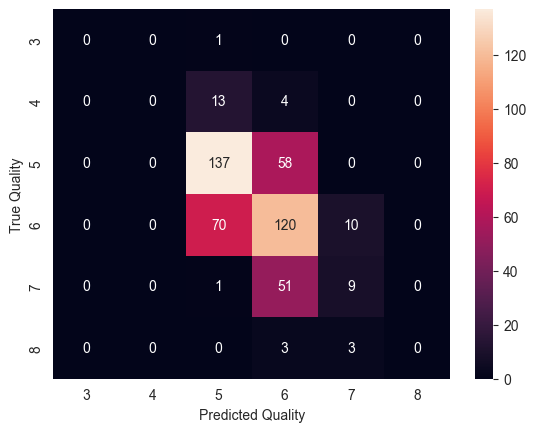

In [14]:
label_aux = plt.subplot()
print("Confussion Matrix of Red Wine:")
cm_linear_regression_red = confusion_matrix(yr_test, y_prediction_lr_red)
cm_lr_red = pd.DataFrame(cm_linear_regression_red,
                     index = ['3', '4','5','6','7','8'],
                     columns = ['3','4','5','6','7','8'])
sns.heatmap(cm_lr_red, annot=True, fmt="d")
label_aux.set_xlabel('Predicted Quality')
label_aux.set_ylabel('True Quality')
plt.show()

Confussion Matrix of White Wine:


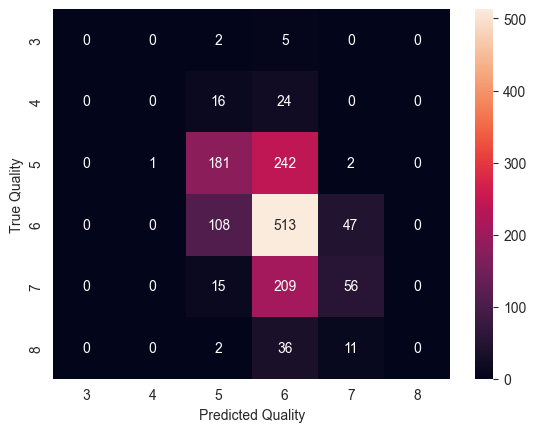

In [15]:
label_aux = plt.subplot()
print("Confussion Matrix of White Wine:")
cm_linear_regression_white = confusion_matrix(yw_test, y_prediction_lr_white)
cm_lr_white = pd.DataFrame(cm_linear_regression_white,
                     index = ['3', '4','5','6','7','8'],
                     columns = ['3','4','5','6','7','8'])
sns.heatmap(cm_lr_white, annot=True, fmt="d")
label_aux.set_xlabel('Predicted Quality')
label_aux.set_ylabel('True Quality')
plt.show()